# Lecture 3. Loss Function and Optimization
## 2장 복습
##### 2장에서는 조명, 변형, 은닉 등 다양한 이유로 이미지 분류의 힘든점과 cross validation, knn, linear classifier를 배웠다.
###### 이미지 분류 시, 입력된 이미지에 가중치(w)를 곱하고 score 점수로 분류를 진행한다.
##### 이번 장에서는, 이미지 분류 시 어떤 수식에 의해 출력된 score에 불만족하는 정도를 정량화 시킬 수 있는 **loss function**과 해당 loss function에 대한 parameter 값을 최소화 시킬 수 있는 **optimization**에 대해 알아본다.

## loss function - SVM
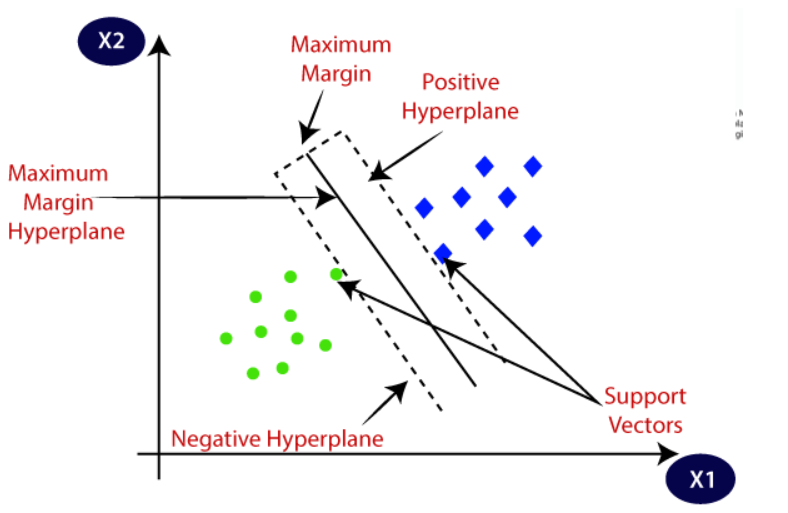

##### SVM(Support Vector Machine)은 2, 3차원 이상의 고차원인 초평면에서 결정경계를 기준으로 데이터를 분류한다. 이때 결정 경계와 인접한 데이터 포인트를 Suppor Vectors, 이 서포트 벡터와 Decision boundary간의 거리를 Margin 이라 한다.
##### SVM은 허용 가능한 오류 범위내에서 가능한 최대 마진을 만들어야 한다. 이러한 SVM은 다항 분류에서도 사용하는데 이를 multiclass SVM이라고 하며, 여기서 사용되는 loss function이 hige loss 이다.

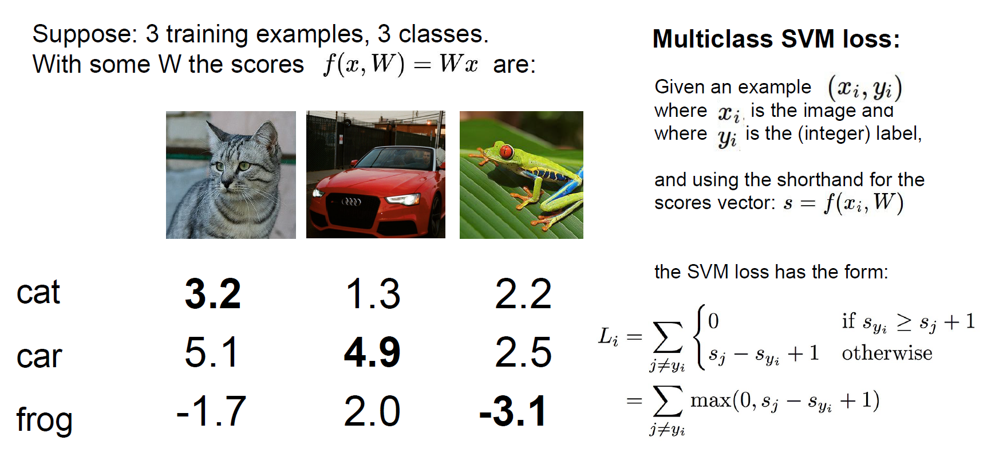

##### 위 사진과 같이 고양이, 자동차, 개구리 세 개의 클래스를 분류하는 트레이닝 셋이 있다고 가정했을 때, 각 class 별 점수를 보면 고양이 클래스의 차 점수가 높다 즉, 잘못 분류했음을 알 수 있다.
##### SVM 함수를 이용해서 loss function이 어떻게 계산되는지 알아보자
* (xi, yi) : xi가 이미지, yi가 레이블
* score vector : f(xi, w)
* sj는 잘못된 레이블의 스코어, sy는 제대로된 레이블의 스코어
* 1은 safty margin
##### 잘못된 레이블 스코어에서 제대로 된 레이블간 스코어 차에 1을 더한 값이 0보다 크면 그 값이 loss가 되고, 0보다 작으면 0일 레이블이 된다.

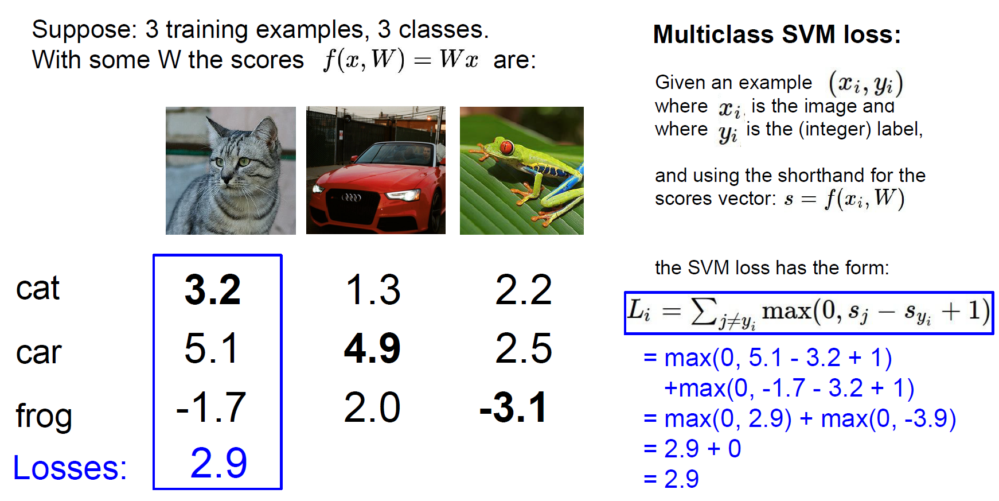

##### 첫 번째 고양이 이미지를 예를 들어보자
##### sj (5,1) 에서 syi (3.2)를 빼고 1을 더하면 2.9 값을 얻게 된다. 그리고 0과 비교하여 최대값 2.9를 얻게 된다.
##### 잘못된 레이블 스코어(frog)에서 맞는 레이블 스코어간의 차를 구하고 1을 더하면 -3.9(-1.7-3.2+1)를 얻게 되는데 0과 비교하여 최대값 0이 된다.
##### 그리고 처음에 구한 2.9와 0을 더해 최종 Li 값은 2.9가 된다.

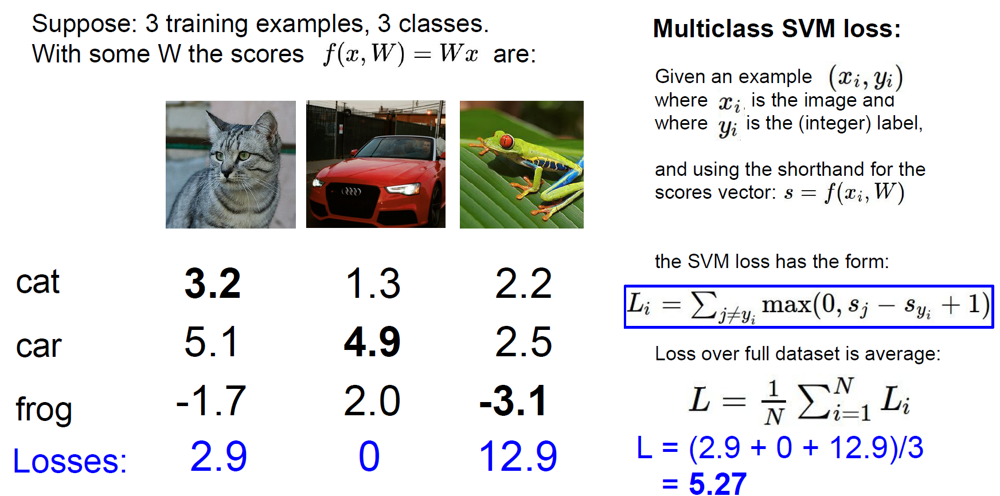

##### 이런식으로 나머지 두 개의 사진도 같은 방법으로 구하고, 각 Li 값을 합산하여 Class 수 만큼 나누면 최종적으로 5.27의 값을 얻게 된다.
##### 여기서 훈련 데이터에 대해서 분류가 잘 되지 않으면 loss function이 높고, 분류가 잘 될 경우에는 loss function이 낮음을 알 수 있다.
1. SVM은 데이터에 둔감하고, score 값이 중요한게 아니라 정답 클래스가 다른 클래스보다 큰지 작은지 중요하다.
2. loss의 최소값은 0이고, 무한대까지 최대 값을 가진다. 또한 loss는 class 갯수 -1 만큼 나온다.

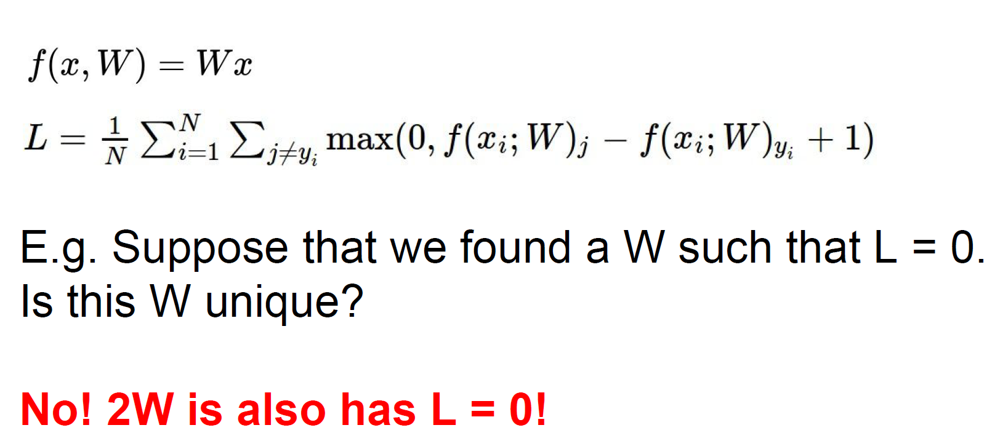

##### 그리고 우리가 구한 Weight가 unique한 값인지 물어보는데, weight는 train set에 맞춰져 있기에, test에서는 training set에서 구한 weight와 다를 수 있다.

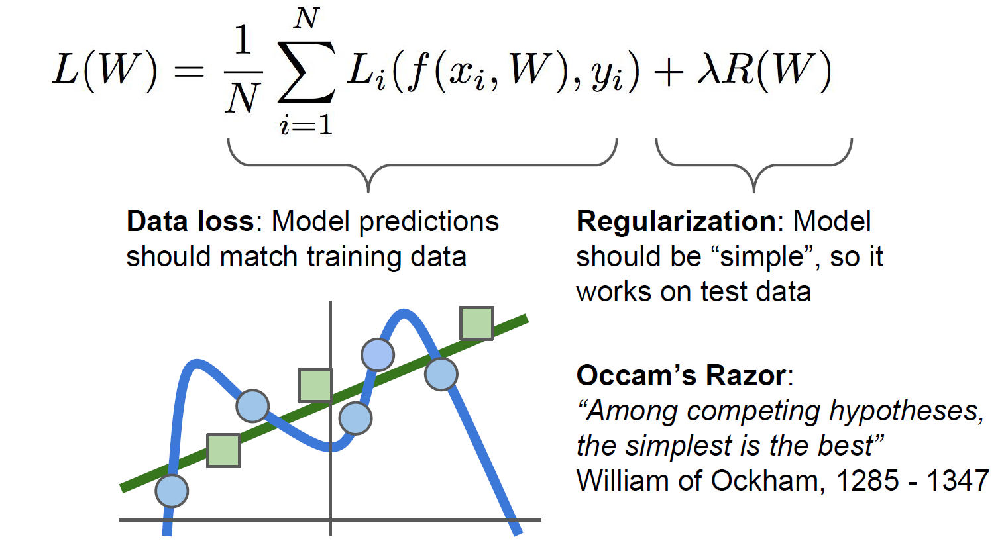

##### 우리가 구한 train이 파란색이라고 가정했을 때, 초록색 네모는 예측하지 못한 상황이 나오게 되는데, 즉 training에 맞춰져 test를 못맞춰 정확도가 낮아지는 것을 과적합(overfitting)이라고 한다.
##### 이러한 train 데이터에 과적합되는 결과를 막기 위해 정규화 규제(regularization)를 추가하여 사용한다.
##### regularization 은 이렇게 특정한 가중치가 너무 과도하게 커지지 않도록 weight decay 학습시켜 일반화 성능을 높이는 데 도움을 준다.
##### 그 중에서도 가장 많이 사용되는 L2에 대해 설명한다.

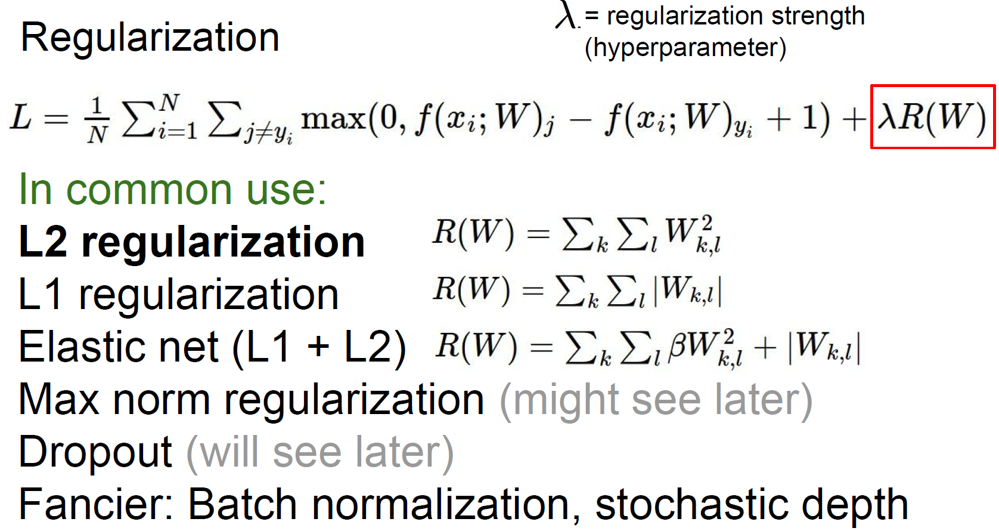

###### L2 regularization을 진행하게 되면 가중치가 전반적으로 작고 고르게 분산된 형태로 진행되 과적합을 줄일 수 있고, test set에 대한 일반적인 성능을 향상시킬 수 있다.
##### 규제항은 이 외에도 L1, L2, Elastic net 등등 많다. 다른 규제항은 추후 강의에 더 다룬다.

## Softmax - Cross entropy loss
##### Multi class SVM이 score 값만 생각하여 분류했다면, softmax는 확률 분포를 이용해 score 자체에 의미를 부여한다.
##### Softmax는 신경망 출력층에서 사용하는 활성함수로, 주로 분류 문제에 사용된다.
##### 구체적으로 점수 벡터를 클래스 별 확률로 변환하기 위해 흔히 사용하는 함수로 각 점수 벡터에 지수를 취한 후, 정규화 상수로 나누어 총 합이 1이 되도록 계산한다.


##### 즉, 입력받은 값을 출력으로 0~1사이의 값으로 모두 정규화하며 출력 값들의 총합은 항상 1이 되는 특성을 가진 함수이다.
###### 예를 들어, 사진 속 인물의 표정을 확률적으로 수치화한다고 했을 때, 슬픔 11% 웃음 29% 화남 60%로 나타났다면 확률적으로 화난 표정에 가깝다고 분류하는 것이다.

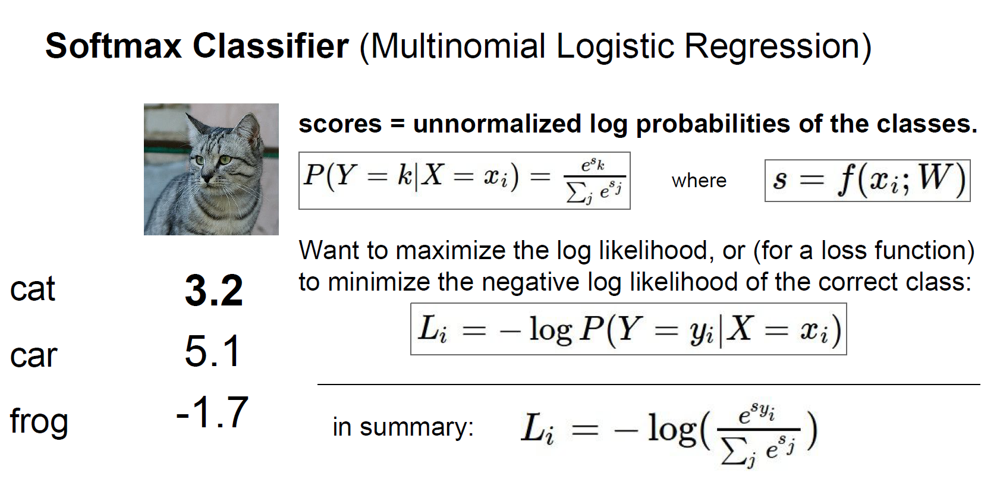

##### 식은 아래와 같다.
* W 가중치를 통해서 우리는 어떤 이미지에 대해 각 클래스별로 score 값을 얻는다.
* 그 스코어 값들을 exp 한다
* exponential 해준 스코어 값들을 위의 식을 통해 정규화하여 확률값 P로 반환한다.
* 우리는 이제 그 값을 최종 스코어로 이용한다.
* 그 확률값들을 -log화하여 loss function을 구한다.

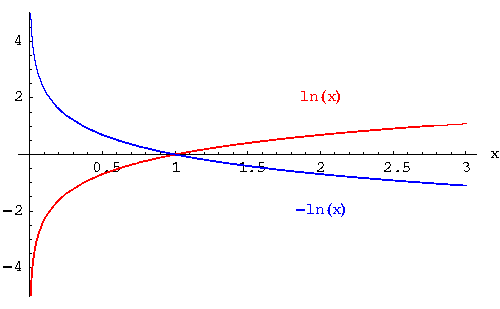

##### 지수 함수를 사용하면 가중치를 더 커지게 하는 효과를 얻을 수 있고, -log를 사용한 이유는 x축을 확률, y축을 loss 라고 했을 때 확률이 1에 가까워질수록 loss가 0에 가까워지기 때문이다.
###### -log 그래프를 생각하면 최소는 이론적으로 0, 최대값은 무한대이다.

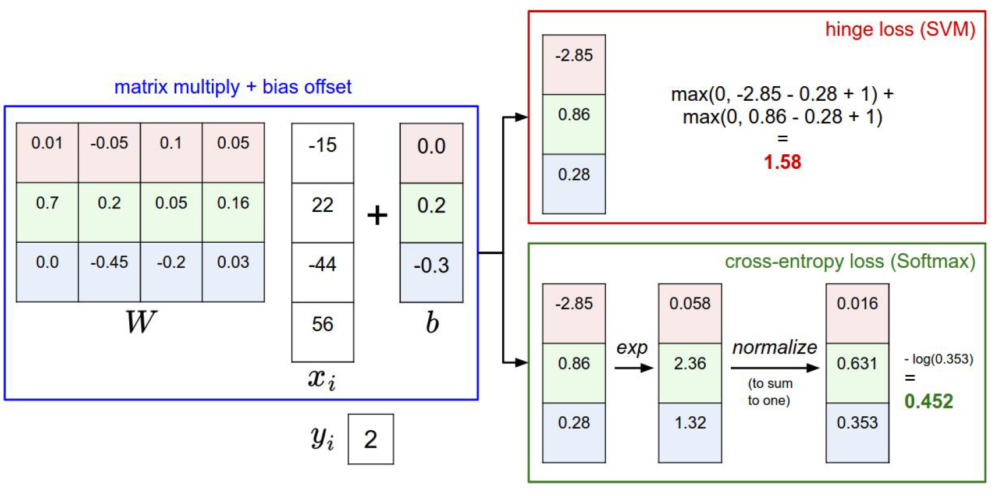

##### 힌지 로스는 max 값을 취해서 도출하지만 cross-entropy는 확률값을 -log화하여 도출한다.

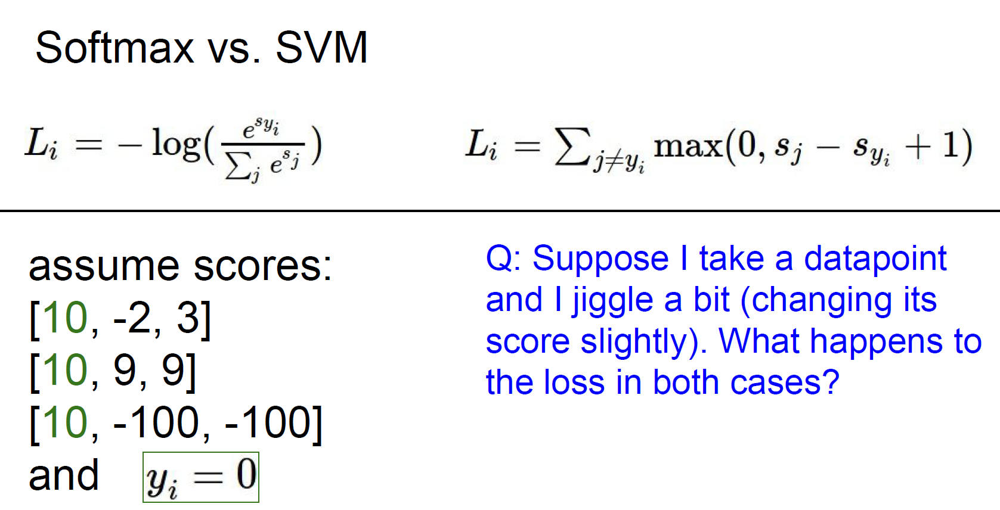

##### data 값에 약간의 변형을 주면, 힌지로스는 3개의 값이 모두 0이지만, cross-entropy는 데이터에 매우 민감해서 전부 다 다른 값을 도출한다. -> 좀 더 합리적이다.

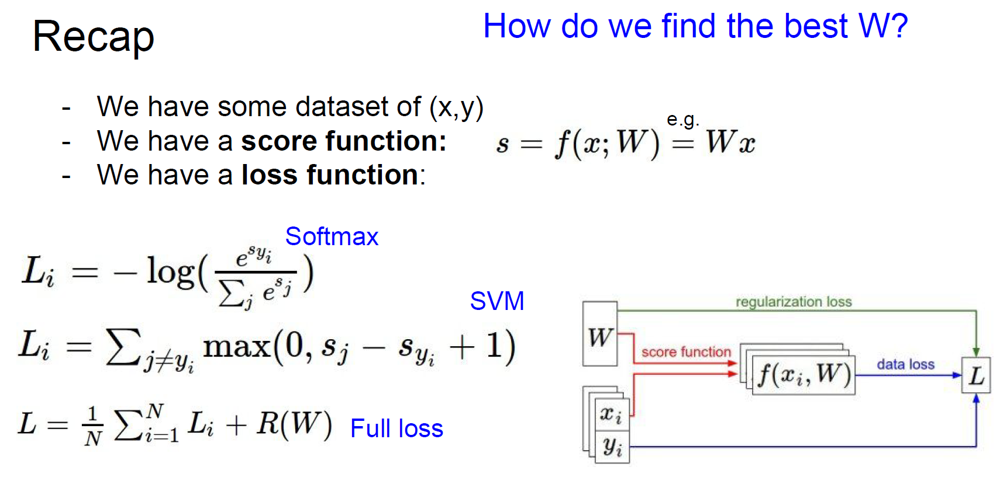

##### full loss는 언제나 규제항을 추가하는 것을 의미한다.
##### 손실함수로 W의 상태에 대한 주소를 알게 되었으니 최적의 W를 찾아야 한다 -> Optimization

## Optimization
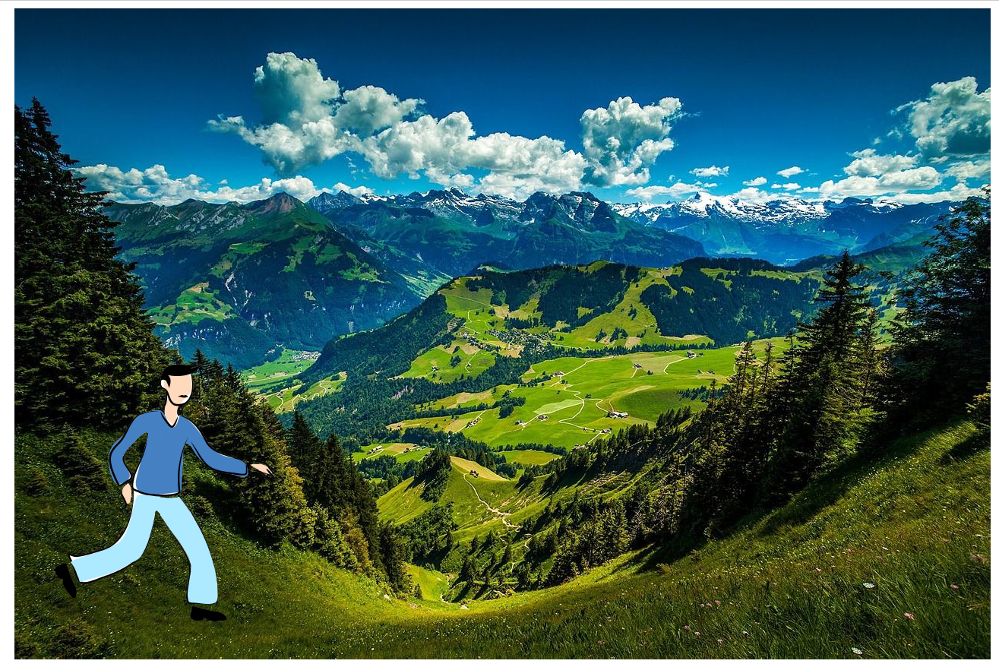

##### 본 강의에서는 우리가 가중치 W를 수정하여 좋은 모델(loss가 0인 지점)로 수정해가는 것은 마치 눈을 감고 광활한 산맥을 따라 내려가는 것에 비유한다.
* optimization은 loss를 최소화 시킬 수 있는 weight를 찾는 것이다. 대표적인 방법으로 random search와 gradient descent가 있다.

##### random search는 w의 위치값을 무작위로 포인트를 찾는 방법이지만 예측의 정확도가 15%~95%로 불안정하기에 사용하지 않는 것을 추천한다.
##### 실질적 전략방법인 경사하강법을 사용하자.

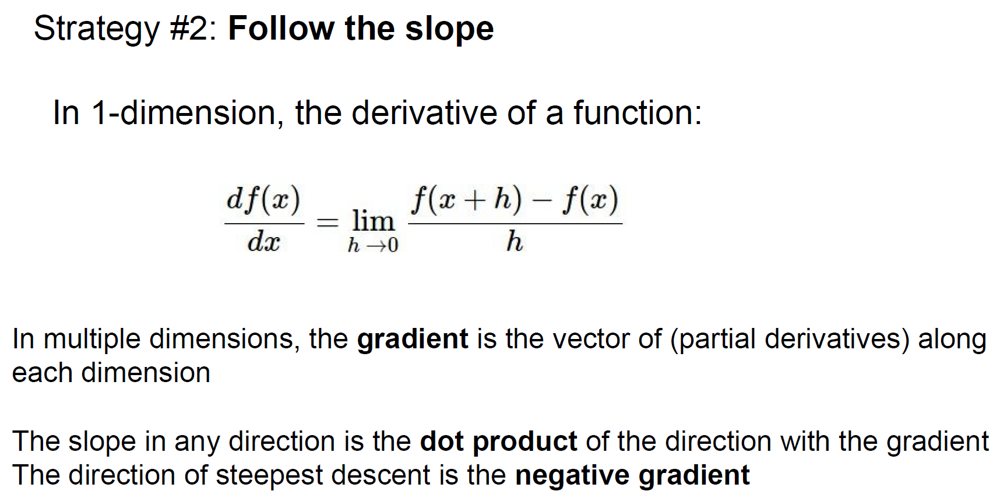

##### 미분 계수를 이용하여 기울기를 통해 손실함수를 줄여 W를 수정해 나간다. 하지만 이를 Numerical gradient라고 하는데, 이 방식은 super slow 다.

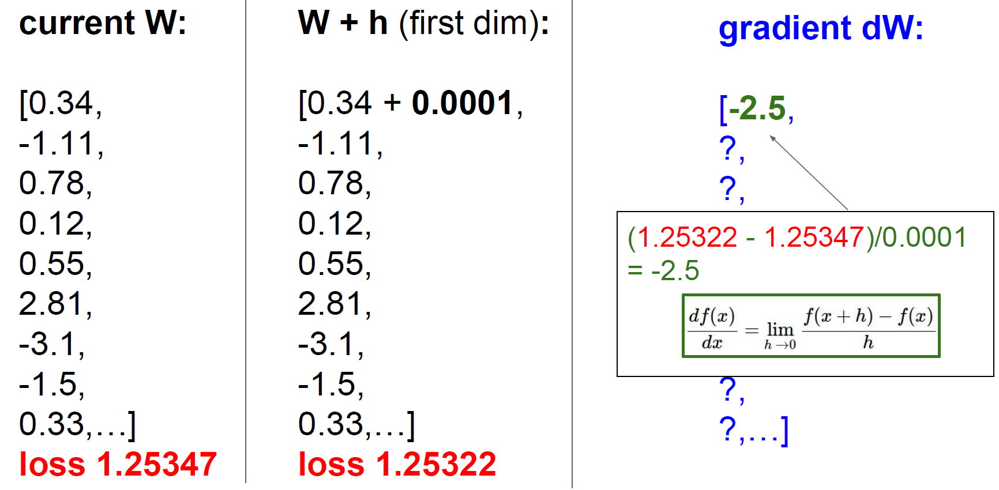

##### 이렇게 w를 하나하나 loss를 보며 수정해 나간다. 첫번째 w는 수정을 통해 loss를 줄였지만 결국 다음에는 loss 값이 증가한다. 즉, 이렇게 하나하나 계산하여 대입하는 Numerical gradient는 너무나도 느리다.

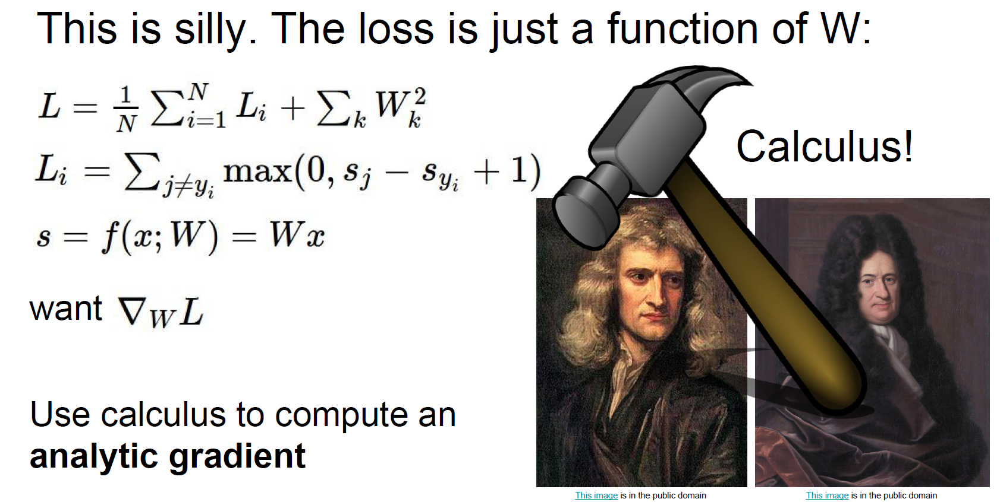

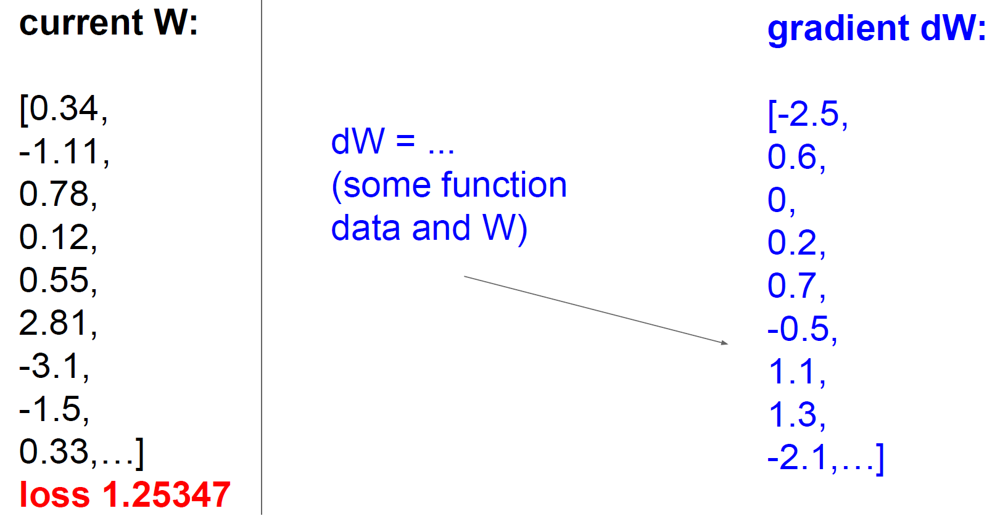

##### 위 두명의 수학자가 만든 미분식으로 w가 변화할 때의 loss 식인 미분식을 이용해 해결했다.
##### 이렇게 미분값들을 쉽게 구해지는데, 이를 analytic gradient라고 하는데, 추후 강의에서 다시 다룰 것이다.

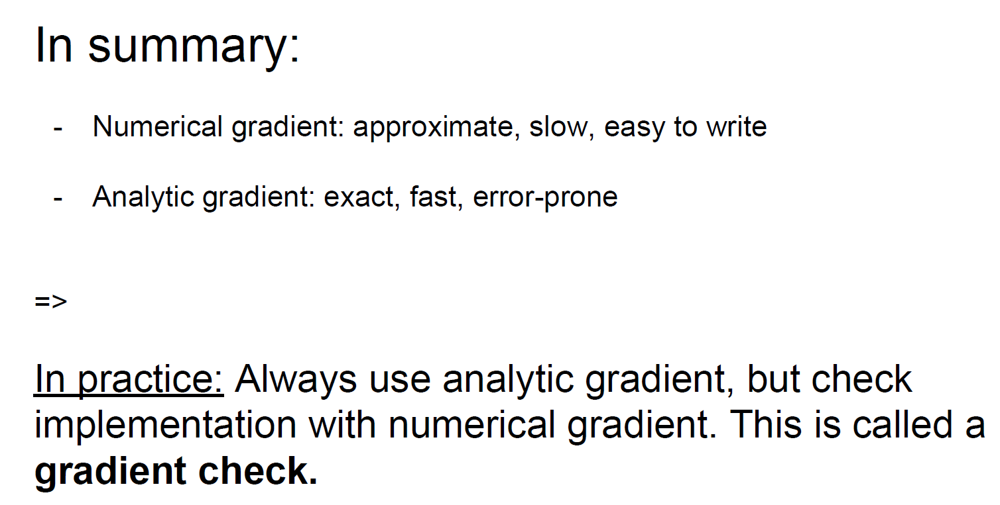

##### 요약하자면
* Numeric gradient : 값이 정확하진 않고 매우 근사적이며, 매우 느리다. 구현하기는 쉽다.
* Analytic gradient : 값이 정확하고 빠르다. 에러가 날 가능성이 있다.

##### 실전에서 후자만 이용한다고 보면 되고, 전자는 후자의 코드를 체크하는 정도로 이용한다. 이를 gradient check 라고 한다.

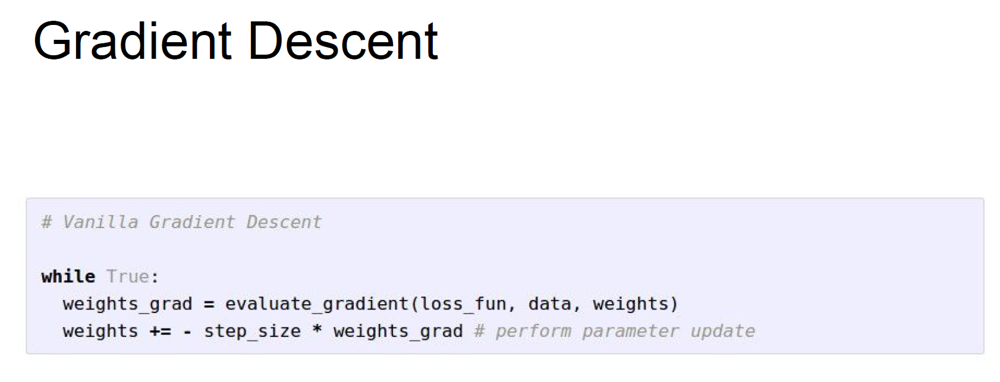

##### 경사 하강법의 코드를 보면 기울기 값에 -step size를 곱하여 weight를 수정해 나간다.
###### learning rate라고 하는 값은 얼마만큼의 비약으로 기울기 값을 변경할지를 지정해주는 것이다.

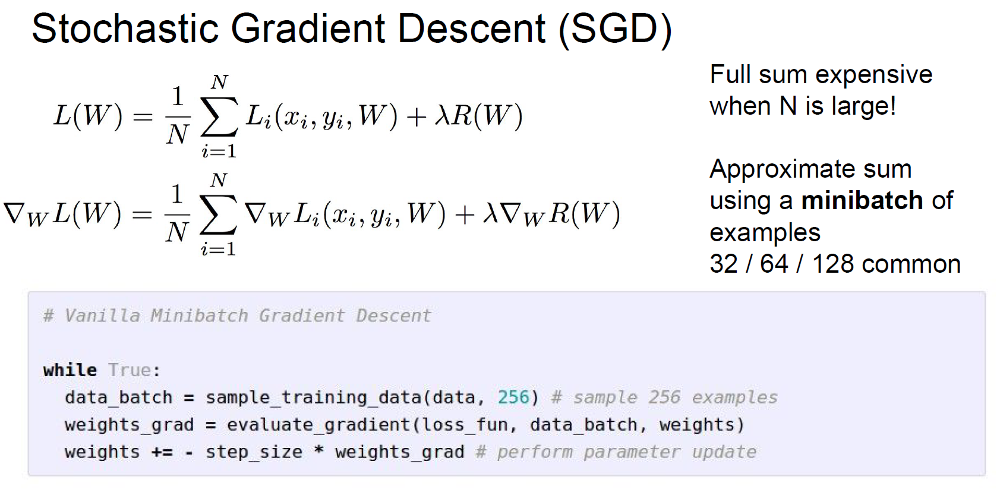

##### 우리는 경사 하강법으로 속도를 높였지만, SGD를 통해서 속도를 더 높일 수가 있다.
##### SGD는 전부 계산한다기 보다는 띄엄띄엄 계산하면서 minibatch를 두어서 수정해나가는 방식이다.
##### 보통 32/64/128 수준으로 지정해주며, 이는 한번에 이 만큼씩만 계산을 하여 수정한다는 의미이다.

## 기존 이미지 추출 방식
##### CNN을 하기 전 일반적인 image classify는 어떻게 했을까?
##### 기존의 방식도 linearal classifier을 이용했지만 original image에 다가 linear classify를 적용하지는 않았다.
##### 단순 히스토그램이나 코드 형태로 feature를 추출하고, 추출한 feature들을 concate하여 이어준다. 그 다음 linear classifer에 적용했다. 이것이 일반적인 방식이었다.

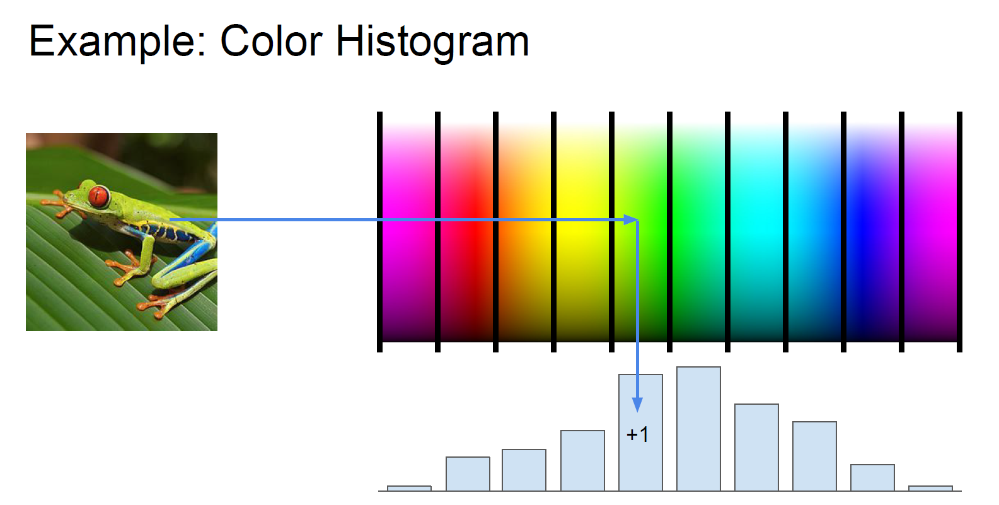

##### 그 중 하나는 바로 Color Histogram이다.
##### 해당 이미지의 컬러들에 대해서 히스토그램으로 가장 많이 나온 컬러를 뽑아낸 것이다.

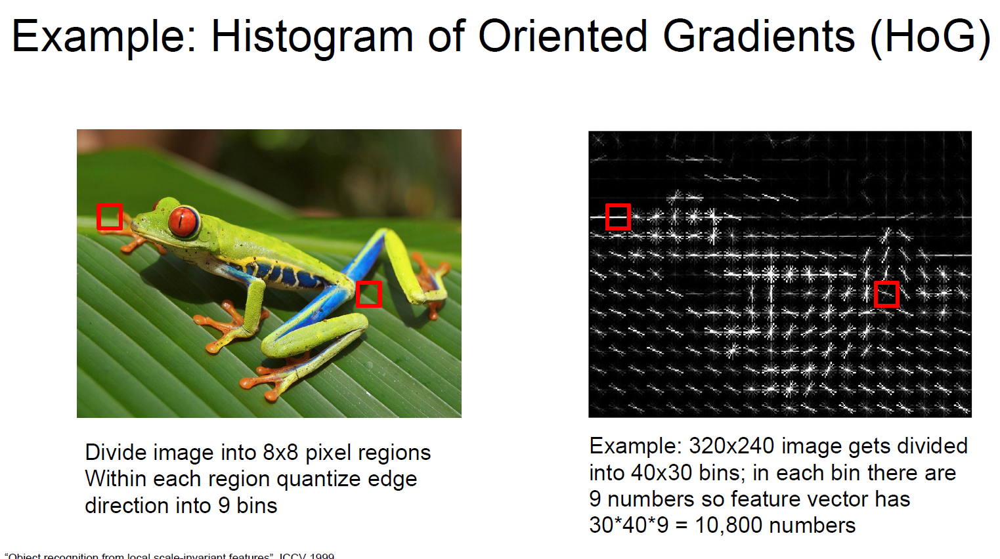

##### 두 번째는 Hog이다.
##### 이미지를 분할해서 각 분할 구역마다의 이미지 방향 값을 뽑아내는 것이다.

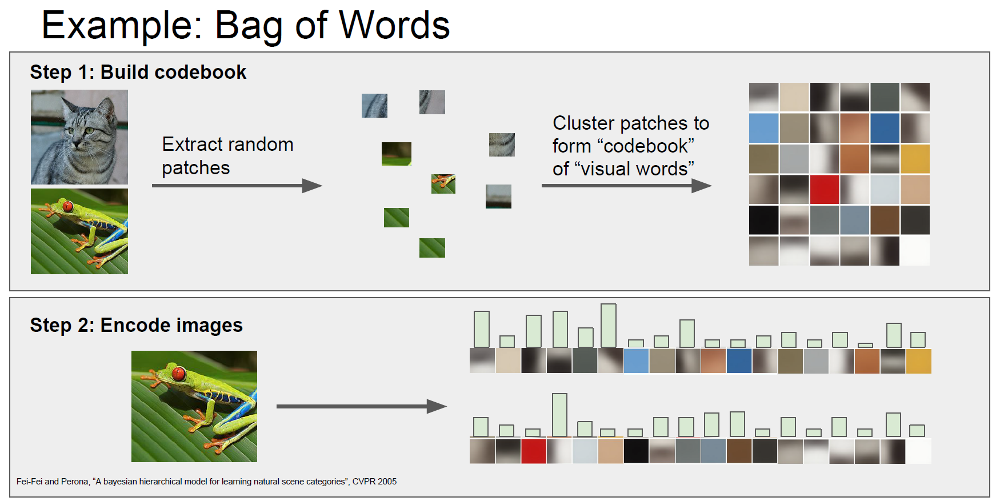

##### 세 번째 방법은 BOW(Bag Of Words)이다.
##### 주로 NLP에서 자주 사용되는 기법인데, 이미지의 여러 지점들을 보고 이 작은 지점의 patch를 frequency 혹은 color의 vector로 기술하게 된다.
##### 이것을 사전화해 사전내에서 테스트할 이미지와 가장 유사한 feature vector를 찾는다. 찾고난 뒤 이를 concatenation 해서 linear classify를 한 방법이 된다.

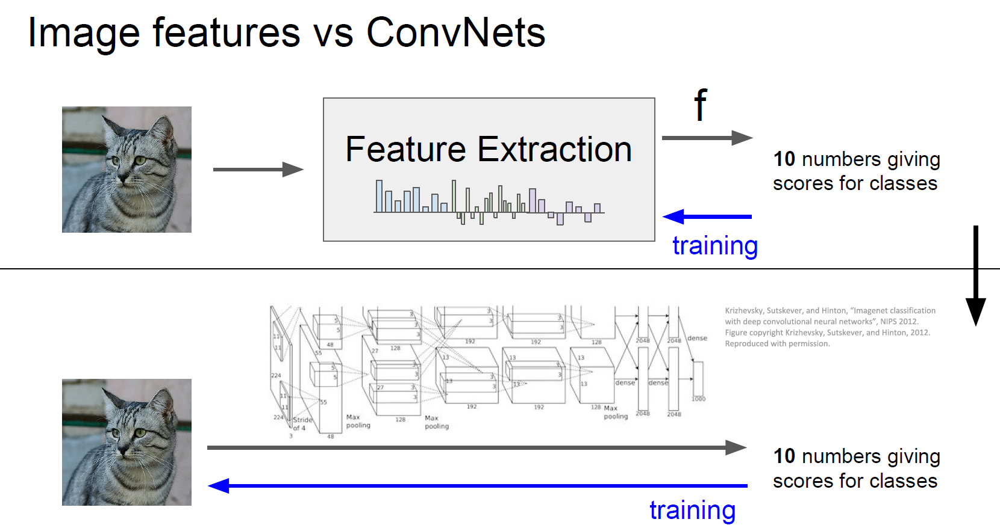

##### 이처럼 기존의 방식은 임의적으로 feature extraction을 통해 이미지를 분류하지만, 다음 강의에는 이미지를 딥러닝 function에 넣어 스스로 특징을 추출하는 방식이다.